In [12]:
using CSV
using DataFrames
using Statistics
using LaTeXStrings
using Plots
using StatsPlots
using TiSR
import DynamicQuantities: uparse,  @u_str


### The new analysis by dataset and in 3x3 plots

In [79]:
columns = ["dataset", "ds_type", "algo", "n_correct", "n_false", "n", "time_stamp"]
collect_statistics_df = DataFrame([name => [] for name in columns])

dataset = [9]
has_original_measures = [1,2,5,7] #original datasets available

algo = ["f1f2f4_baseline", "f1f2f3f4_obj_penalty",  "f1f2f4_correct_all", "f1f2f4_death_penalty"]
dataset_type = ["wo_noise", "005noise", "01noise"]

for ds in dataset
    valid_eqs = String[]
    if ds == 9
        dataset_type = ["wo_noise", "001noise", "003noise"]
    end
    for dst in dataset_type
        if dst == "original"
            if ds in has_original_measures
                dataset_appendix = "_original"
            else
                dataset_appendix = "_generated_noise"
            end
        elseif dst == "wo_noise"
            dataset_appendix = "_generated_wo_noise"
        elseif dst == "001noise"
            dataset_appendix = "_generated_001noise"
        elseif dst == "003noise"
            dataset_appendix = "_generated_003noise"
        elseif dst == "005noise"
            dataset_appendix = "_generated_005noise"
        elseif dst == "01noise"
            dataset_appendix = "_generated_01noise"
        elseif dst == "015noise"
            dataset_appendix = "_generated_015noise"
        elseif dst == "03noise"
            dataset_appendix = "_generated_03noise"
        elseif dst == "05noise"
            dataset_appendix = "_generated_05noise"
        end

        for al in algo
            columns = ["time_stamp", "run", "compl", "age", "dim_penalty", "minus_spearman", "mare", "mae",  "ms_processed_e", "eqs_orig_rounded"]

            res_good_df = CSV.read("./analysis/allPPSNdatasets/$(ds)$(dataset_appendix)_$(al)_good.csv", DataFrame) 
            res_bad_df = CSV.read("./analysis/allPPSNdatasets/$(ds)$(dataset_appendix)_$(al)_bad.csv", DataFrame) 
            
            n_correct = nrow(res_good_df)
            n_false = nrow(res_bad_df)
            mean_timestamp = 0.0
            try 
                mean_timestamp = mean(skipmissing(res_good_df.time_stamp))
            catch
                mean_timestamp = 0.0
            end
            push!(collect_statistics_df, [ds, dst, al, n_correct, n_false, n_correct+n_false, res_good_df.time_stamp])
        end
    end
end

for col in names(collect_statistics_df)
    collect_statistics_df[ismissing.(collect_statistics_df[:,col]), col] .= 0.0
end

#sort by dataset, then by algo
collect_statistics_df = sort(collect_statistics_df, [:dataset, :ds_type, :algo])

println(collect_statistics_df)

12×7 DataFrame
 Row │ dataset  ds_type   algo                  n_correct  n_false  n    time_stamp                        
     │ Any      Any       Any                   Any        Any      Any  Any                               
─────┼─────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ 9        001noise  f1f2f3f4_obj_penalty  31         0        31   [1065.8, 1706.93, 490.578, 1111.…
   2 │ 9        001noise  f1f2f4_baseline       31         0        31   [1268.63, 1700.04, 1372.5, 1420.…
   3 │ 9        001noise  f1f2f4_correct_all    31         0        31   [1726.4, 890.811, 1446.59, 1360.…
   4 │ 9        001noise  f1f2f4_death_penalty  31         0        31   [1472.65, 838.645, 775.191, 536.…
   5 │ 9        003noise  f1f2f3f4_obj_penalty  29         1        30   [757.655, 1049.72, 1272.02, 1554…
   6 │ 9        003noise  f1f2f4_baseline       27         1        28   [1726.9, 1090.28, 1771.21, 1219.…
   7 │ 9        003

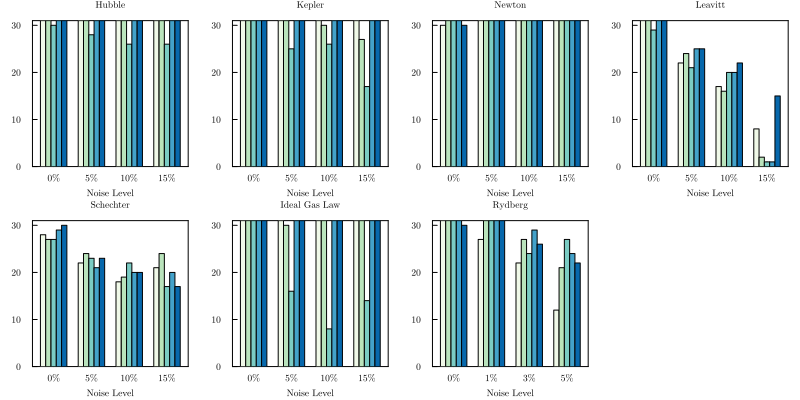

In [59]:


plot_font = "Computer Modern"
default(fontfamily=plot_font,
        linewidth=1, framestyle=:box, label=nothing, grid=false)
#scalefontsizes(0.7)
#make list of dfs
plots = []
dataset_type = ["0%", "5%", "10%", "15%"]

for ds in dataset
    n_correct_lists = []
    df = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
    df_plot = groupby(df, :ds_type)
    if ds == 9
        dataset_type = ["0%", "1%", "3%", "5%"]
        df_plot= df_plot[[("wo_noise",), ("001noise",), ("003noise",), ("005noise",)]]
    else
        df_plot= df_plot[[("wo_noise",), ("005noise",), ("01noise",), ("015noise",)]]
    end
    a = [Array{Float64}(x[!,:n_correct]) for x in df_plot]
    a = mapreduce(permutedims, vcat, a)

    push!(plots, groupedbar(a, bar_position = :dodge, bar_width=0.7, title="$(datasets_names[ds])", xticks=(1:4, dataset_type), label="", palette = :GnBu_5,  xlabel="Noise Level", ylims=(0,31), titlefontsize = 6, tickfontsize = 6, guidefontsize = 6))
end

plot(plots..., layout= (2,4), size = (800, 400))

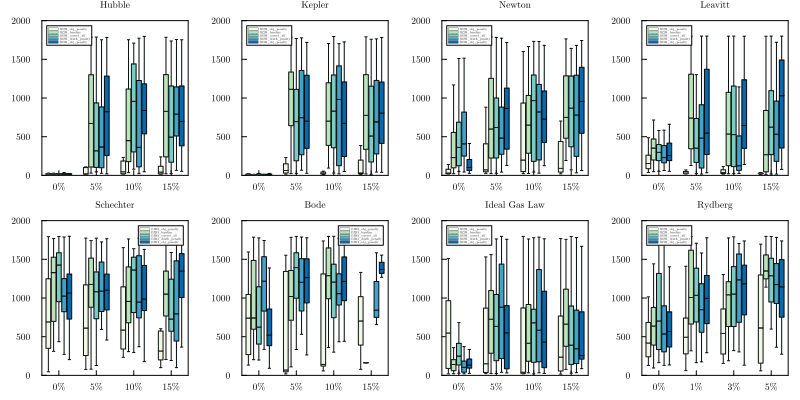

In [48]:
dataset_type = ["wo_noise", "005noise", "01noise", "015noise"]
plots = []
datasets_names = ["Hubble", "Kepler", "Newton", "Planck", "Leavitt", "Schechter", "Bode", "Ideal Gas Law", "Rydberg"]

for ds in dataset
    time_stamps = []
    dsts = []
    als = []
    if ds == 9
        dataset_type = ["wo_noise", "001noise", "003noise", "005noise"]
    end
    for dst in dataset_type
        for al in algo
            df = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
            df = df[df.ds_type .== dst, :]
            df = df[df.algo .== al, :]
            time_stamp = df.time_stamp[1]
            if dst == "wo_noise"
                label = "0%"
            elseif dst == "001noise"
                label = "1%"
            elseif dst == "003noise"
                label = "3%"
            elseif dst == "005noise"
                label = "5%"
            elseif dst == "01noise"
                label = "10%"
            elseif dst == "015noise"
                label = "15%"
            end
            dst_ = repeat([label], length(time_stamp))
            al_ = repeat([al], length(time_stamp))
            push!(time_stamps, time_stamp...)
            push!(dsts, dst_...)
            push!(als, al_...)
        end
    end
    push!(plots, groupedboxplot(dsts, time_stamps, group = als, bar_position = :dodge, bar_width=0.7, title="$(datasets_names[ds])", palette = :GnBu_5, y_lims=(0,2000), titlefontsize = 6, tickfontsize = 6, guidefontsize = 6, outliers = false))

end

plot(plots..., layout= (2,4), size = (800, 400))

### Analysis of advanced experiments

In [18]:
#change compl column in experiments for dataset 10, f1f2f4_correct_all
exp_name = "finalStokes"

dataset_prefix = "./data/thirtyParticles"

arbitrary_name = "Re0_phi005_n30_symmetricRotation_dimensionless"


data_matrix = Matrix(CSV.read("$(dataset_prefix)/$(arbitrary_name)_val.csv", DataFrame))
data_matrix = data_matrix[:, [1,2,3,7,8]]
units = [u"m",  u"0", u"0", u"N", u"0"]

time = 60 * 120.0

always_correct_dims = false
p_correct_dims = 0.0
death_penalty_dims = false
hall_of_fame_objectives = [:ms_processed_e, :dim_penalty, :custom_compl]
selection_objectives = [:ms_processed_e, :minus_spearman, :dim_penalty, :custom_compl]

# ==================================================================================================
# preparation
# ==================================================================================================

train_part = size(data_matrix,1)
train_configs = round(train_part/30 * 0.5)
parts_1 = train_configs*30 / train_part 
parts_2 = 1 - parts_1

parts = [1.0, 0.0]
p_binops_        = (1.0, 1.0, 1.0, 1.0, 1.0)  # -> probabilites for selection of each binary functions (same length as provided binops) (dont need to add up to 1, adjusted accordingly)
p_unaops_        = (1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0)  # -> probability for each unary function
n_gen = 150
# ==================================================================================================
# options -> specify some custom settings, where the default setting is unsatisfactory
# ==================================================================================================
pow_abs(v1, v2) = abs(v1)^v2
sqrt_abs(v1) = sqrt(abs(v1))
pow2(v1) = v1^2
ops, data = Options(
    data_descript=data_descript(
            data_matrix;
            arbitrary_name = arbitrary_name,
            parts          = parts,
            #fit_weights    = fit_weights, 
            units          = units,
        ),
        general=general_params(
            n_gens                  = n_gen,
            pop_size                = 500,
            max_compl               = 35,
            pow_abs_param           = true,
            prevent_doubles         = 1e-7,
            t_lim                   = typemax(Float64),
            multithreadding         = true,
            always_correct_dims     = always_correct_dims,
            death_penalty_dims      = death_penalty_dims,
            always_drastic_simplify = false,
        ),
        selection=selection_params(
            hall_of_fame_objectives           = hall_of_fame_objectives,          # -> objectives for the hall_of_fame
            selection_objectives              = selection_objectives              # -> objectives for the Pareto-optimal selection part of selection
        ),
        fitting=fitting_params(
            early_stop_iter = 5,
            max_iter        = 30,
            pre_residual_processing = nothing,),

            binops          = (  +,   -,   *,   /,  ^),  # -> binary function set to choose from
            p_binops        = p_binops_,  # -> probabilites for selection of each binary functions (same length as provided binops) (dont need to add up to 1, adjusted accordingly)
            unaops          = (exp, log, sin, cos, abs, sqrt_abs, pow2),  # -> unary function set to choose from
            p_unaops        = p_unaops_,  # -> probability for each unary function
            illegal_dict = Dict(:sin => (sin, cos),
                            :cos => (sin, cos),
                            :abs => (abs,),
                            :exp => (exp, sqrt_abs), #log
                            :log => (log,), #exp
                            :pow2 => (log, sqrt_abs),
                            :sqrt_abs => (sqrt_abs,),
                            :^ => (^,),),

        mutation=mutation_params(;
            p_crossover        = 4.0,
            p_point            = 0.5,
            p_innergrow        = 0.0,
            p_insert           = 0.2,
            p_hoist            = 0.2,
            p_subtree          = 0.2,
            p_add_term         = 0.1,
            p_simplify         = 0.5,
            p_drastic_simplify = 0.5,
            p_correct_dims     = p_correct_dims,),
    );

for i in 0:30
    #open csv file and change it
    df = CSV.read("results/allPPSNdatasets/10_generated_noise_f1f2f4_correct_all_$(i)/10_generated_noise_f1f2f4_correct_all_$(i)_hall_of_fame.csv", DataFrame)
    for j in 1:nrow(df)
        eq = df[j, :eqs_orig_rounded]
        eq = replace(eq, r"--" => "+")
        parsed = TiSR.string_to_node(eq, ops)
        compl = TiSR.custom_compl(parsed, ops)
        println(compl)
        df[j, :compl] = compl
    end
    CSV.write("results/allPPSNdatasets/10_generated_noise_f1f2f4_correct_all_$(i)/10_generated_noise_f1f2f4_correct_all_$(i)_hall_of_fame.csv", df)
end

[452880, 452880]

┌ Warning: ^ is only valid for positive bases. Otherwise provide a pow(abs(x), y) function with its own drawbacks.
└ @ TiSR /Users/juliareu/GitCode/TiSR/src/options.jl:39


2.0
7.0
9.0
11.0
11.0
14.0
11.0
16.0
14.0
16.0
16.0
19.0
21.0
22.0
29.0
26.0
27.0
28.0
30.0
30.0
32.0
33.0
35.0
2.0
7.0
9.0
9.0
10.0
11.0
13.0
11.0
16.0
15.0
16.0
19.0
19.0
21.0
24.0
25.0
27.0
27.0
28.0
32.0
33.0
33.0
35.0
2.0
7.0
9.0
9.0
11.0
13.0
11.0
16.0
14.0
18.0
16.0
20.0
18.0
19.0
23.0
21.0
22.0
28.0
27.0
28.0
30.0
32.0
33.0
35.0
37.0
38.0
2.0
7.0
9.0
11.0
11.0
11.0
13.0
14.0
18.0
16.0
21.0
19.0
21.0
23.0
25.0
26.0
27.0
28.0
30.0
32.0
35.0
2.0
7.0
9.0
9.0
11.0
11.0
13.0
11.0
13.0
14.0
18.0
18.0
19.0
23.0
21.0
22.0
27.0
27.0
28.0
30.0
35.0
35.0
2.0
6.0
7.0
9.0
9.0
10.0
11.0
13.0
11.0
16.0
16.0
16.0
21.0
19.0
21.0
23.0
25.0
26.0
28.0
29.0
30.0
32.0
33.0
34.0
38.0
2.0
6.0
9.0
9.0
11.0
11.0
13.0
11.0
16.0
13.0
18.0
16.0
21.0
19.0
21.0
22.0
24.0
26.0
28.0
30.0
33.0
34.0
37.0
2.0
7.0
9.0
9.0
10.0
11.0
13.0
11.0
15.0
16.0
16.0
18.0
21.0
21.0
24.0
27.0
28.0
26.0
28.0
33.0
33.0
34.0
35.0
37.0
2.0
7.0
8.0
9.0
11.0
11.0
11.0
16.0
13.0
14.0
18.0
16.0
21.0
19.0
21.0
23.0
25.0
27.0
27.0
30.0


In [19]:
columns = ["dataset", "algo", "n_row", "n_dimpenalty", "p_dimpenalty", "n_gen", "n_const", "no_alternatives_wo_dimpenalty"]
collect_statistics_df = DataFrame([name => [] for name in columns])

df_scatter_PO_baseline = DataFrame([name => [] for name in ["compl", "dim_penalty", "ms_processed_e"]])
df_scatter_PO_culling = DataFrame([name => [] for name in ["compl", "dim_penalty", "ms_processed_e"]])
df_scatter_PO_repair = DataFrame([name => [] for name in ["compl", "dim_penalty", "ms_processed_e"]])
df_scatter_PO_MOO = DataFrame([name => [] for name in ["compl", "dim_penalty", "ms_processed_e"]])

datasets = [10,15,16]
dataset_names = ["10_generated_noise_", "15_generated_wo_noise_", "16_generated_wo_noise_"]
algos = ["f1f2f4_baseline", "f1f2f3f4_obj_penalty", "f1f2f4_correct_all", "f1f2f4_death_penalty"]
runs = 0:30
for (i, ds) in enumerate(datasets)
    for algo in algos
        for r in runs
            ds_name = dataset_names[i]
            df = CSV.read("./results/allPPSNdatasets/$(ds_name)$(algo)_$(r)/$(ds_name)$(algo)_$(r)_hall_of_fame.csv", DataFrame)
            nrow = size(df, 1)
            n_dimpenalty = sum(df.dim_penalty.>0.0)
            n_const = mean(df.n_params)
            df_gen = CSV.read("./results/allPPSNdatasets/$(ds_name)$(algo)_$(r)/$(ds_name)$(algo)_$(r)_progress.csv", DataFrame)
            n_gen = df_gen.generation[end]
            complexities = unique(df.compl)
            #find number of complexities without alternatives, only relevant for "f1f2f3f4_obj_penalty"
            no_alternatives_wo_dimpenalty = 0
            for c in complexities
                #find all equations with complexity c
                eqs = df[df.compl .== c, :]
                #find whether an equation of eqs has 0.0 dim_penalty
                n_wo_dimpenalty = sum(eqs.dim_penalty.==0.0)
                if n_wo_dimpenalty == 0
                    no_alternatives_wo_dimpenalty += 1
                end
            end

            #plot PO fronts for TD dataset
            if ds == 10
                if algo == "f1f2f4_baseline"
                    push!(df_scatter_PO_baseline, [df.compl, df.dim_penalty, df.ms_processed_e])
                elseif algo == "f1f2f3f4_obj_penalty"
                    push!(df_scatter_PO_MOO, [df.compl, df.dim_penalty, df.ms_processed_e])
                elseif algo == "f1f2f4_correct_all"
                    push!(df_scatter_PO_repair, [df.compl, df.dim_penalty, df.ms_processed_e])
                elseif algo == "f1f2f4_death_penalty"
                    push!(df_scatter_PO_culling, [df.compl, df.dim_penalty, df.ms_processed_e])
                end
            end
            

            push!(collect_statistics_df, [ds, algo, nrow, n_dimpenalty, n_dimpenalty/nrow, n_gen, n_const, no_alternatives_wo_dimpenalty/length(complexities)])
        end
    end
end

println(collect_statistics_df)

372×8 DataFrame
 Row │ dataset  algo                  n_row  n_dimpenalty  p_dimpenalty  n_gen   n_const  no_alternatives_wo_dimpenalty 
     │ Any      Any                   Any    Any           Any           Any     Any      Any                           
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ 10       f1f2f4_baseline       24     19            0.791667      6550.0  3.04167  0.791667
   2 │ 10       f1f2f4_baseline       25     22            0.88          5381.0  2.92     0.88
   3 │ 10       f1f2f4_baseline       23     21            0.913043      5261.0  2.69565  0.913043
   4 │ 10       f1f2f4_baseline       27     23            0.851852      5341.0  2.96296  0.851852
   5 │ 10       f1f2f4_baseline       25     21            0.84          5023.0  2.76     0.84
   6 │ 10       f1f2f4_baseline       25     22            0.88          5040.0  2.72     0.88
   7 │ 10       f1f2f4_baseline       2

In [20]:
n_gen_list = []
p_dim_list = []
n_row_list = []
n_const_list = []
dss = []
als = []
factor_list = [3143.0, 91.0, 93.0]
algo_names_list = ["Baseline", "Multi-objective Approach", "Repair Mechanism", "Evolutive Culling"]
for (i, ds) in enumerate(datasets)
    for (j, al) in enumerate(algos)
        df = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
        df = df[df.algo .== al, :]
        n_gen = df.n_gen ./factor_list[i]

        #println(ds, " ", al, " ", min(n_gen...))
        if al == "f1f2f3f4_obj_penalty"
            p_dimpenalty = df.no_alternatives_wo_dimpenalty
        else
            p_dimpenalty = df.p_dimpenalty
        end
        n_rows = df.n_row
        n_const = df.n_const
        if ds == 10
            label = "TD"
        elseif ds == 15
            label = "FM, \$\\phi\$ = 0.05"
        elseif ds == 16
            label = "FM, \$\\phi\$ = 0.1"
        end
        

        ds_ = repeat([label], length(n_gen))
        al_ = repeat([algo_names_list[j]], length(n_gen))
        push!(n_gen_list, n_gen...)
        push!(p_dim_list, p_dimpenalty...)
        push!(n_row_list, n_rows...)
        push!(n_const_list, n_const...)
        push!(dss, ds_...)
        push!(als, al_...)
    end
end



In [22]:
plot_font = "Computer Modern"
pal = :GnBu_4
default(fontfamily=plot_font, framestyle=:box, linewidth=1, palette = pal, label = nothing, grid = true, bar_position = :dodge, bar_width=0.7)
#default(fontfamily=plot_font, framestyle=:box, label=nothing, grid=false)


In [5]:
all_advanced_plots = []

Any[]

In [7]:
pl = groupedboxplot(dss, n_row_list, group = als, bar_position = :dodge, bar_width=0.7, palette = :GnBu_5, y_lims=(0,80), titlefontsize = 6, tickfontsize = 12, legendfontsize = 12, outliers = true, ylabel = "Number of solutions",  grid = true, yguidefontsize = 12)
push!(all_advanced_plots, pl)
plot(pl, size=(425,350))
savefig("plots/n_solutions.svg")

"/Users/juliareu/GitCode/flowingSR/plots/n_solutions.svg"

In [10]:
pl = groupedboxplot(dss, p_dim_list, group = als, bar_position = :dodge, bar_width=0.7, palette = :GnBu_5, y_lims=(0,1), titlefontsize = 6, tickfontsize = 12, legendfontsize = 12, outliers = true, label="", ylabel="% solutions with unit violations",  grid = true, yguidefontsize = 12)
push!(all_advanced_plots, pl)
plot(pl, size=(425,350))
savefig("plots/p_dim_viol.svg")


"/Users/juliareu/GitCode/flowingSR/plots/p_dim_viol.svg"

In [12]:
pl = groupedboxplot(dss, n_const_list, group = als, bar_position = :dodge, bar_width=0.7, palette = :GnBu_5, y_lims=(0,5), titlefontsize = 6, tickfontsize = 12, legendfontsize = 12, outliers = true, ylabel="Mean number of constants per equation", label="",  grid = true, yguidefontsize = 12)
push!(all_advanced_plots, pl)
plot(pl, size=(425,350))
savefig("plots/n_constants.svg")


"/Users/juliareu/GitCode/flowingSR/plots/n_constants.svg"

In [14]:
pl = groupedboxplot(dss, n_gen_list, group = als, bar_position = :dodge, palette = pal, bar_width=0.7,  y_lims=(0.9,2.6), titlefontsize = 6, tickfontsize = 12, legendfontsize = 12,  outliers = true, ylabel = "Number of generations (normalized)", label="",  grid = true, yguidefontsize = 12)
push!(all_advanced_plots, pl)
plot(pl, size=(425,350))
savefig("plots/n_gen.svg")
#savefig("plots/n_gen.pdf")

"/Users/juliareu/GitCode/flowingSR/plots/n_gen.svg"

In [10]:
plot(all_advanced_plots..., layout= (2,2), size = (850,700), dpi=1000)


In [11]:
savefig("plots/allplots.svg")

"/Users/juliareu/GitCode/flowingSR/plots/allplots.svg"

### Statistical tests


In [146]:
using HypothesisTests

println("Mann-Whitney U Test on NUMBER OF GENERATIONS for Baseline and Multi-objective Approach")
for (i, ds) in enumerate(datasets)
    println("Dataset: ", ds)
    baseline = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
    baseline = baseline[baseline.algo .== "f1f2f4_baseline", :]
    baseline_values = collect(baseline[:,:n_gen])
    baseline_values = map(x->x, baseline_values)    
    for (j, al) in enumerate(algos)
        if al != "f1f2f4_baseline"
            df = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
            df = df[df.algo .== al, :]
            df_values = collect(df[:,:n_gen])
            df_values = map(x->x, df_values)
            p = pvalue(HypothesisTests.MannWhitneyUTest(baseline_values, df_values))
            println("p-value for $(algo_names_list[j]) and Baseline: ", p)
        end
    end
end


Mann-Whitney U Test on NUMBER OF GENERATIONS for Baseline and Multi-objective Approach
Dataset: 10
p-value for Multi-objective Approach and Baseline: 1.6948241824504904e-6
p-value for Repair Mechanism and Baseline: 6.078002222191097e-9
p-value for Evolutive Culling and Baseline: 2.018802481856809e-8
Dataset: 15
p-value for Multi-objective Approach and Baseline: 0.1924659722684045
p-value for Repair Mechanism and Baseline: 1.651626501956737e-9
p-value for Evolutive Culling and Baseline: 2.7046017984940356e-6
Dataset: 16
p-value for Multi-objective Approach and Baseline: 0.8657058355109114
p-value for Repair Mechanism and Baseline: 6.271685340982892e-5
p-value for Evolutive Culling and Baseline: 0.00020502429357737982


In [140]:
println("Mann-Whitney U Test on NUMBER OF SOLUTIONS for Baseline and Multi-objective Approach")
for (i, ds) in enumerate(datasets)
    println("Dataset: ", ds)
    baseline = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
    baseline = baseline[baseline.algo .== "f1f2f4_baseline", :]
    baseline_values = collect(baseline[:,:n_row])
    baseline_values = map(x->x, baseline_values)    
    for (j, al) in enumerate(algos)
        if al != "f1f2f4_baseline"
            df = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
            df = df[df.algo .== al, :]
            df_values = collect(df[:,:n_row])
            df_values = map(x->x, df_values)
            p = pvalue(HypothesisTests.MannWhitneyUTest(baseline_values, df_values))
            println("p-value for $(algo_names_list[j]) and Baseline: ", p)
        end
    end
end


Mann-Whitney U Test on NUMBER OF SOLUTIONS for Baseline and Multi-objective Approach
Dataset: 10
p-value for Multi-objective Approach and Baseline: 1.2629072273352937e-11
p-value for Repair Mechanism and Baseline: 0.48314491585356795
p-value for Evolutive Culling and Baseline: 4.579347864066883e-9
Dataset: 15
p-value for Multi-objective Approach and Baseline: 2.34372051925786e-10
p-value for Repair Mechanism and Baseline: 0.73146905673584
p-value for Evolutive Culling and Baseline: 0.001976844894230332
Dataset: 16
p-value for Multi-objective Approach and Baseline: 1.0232984714542443e-9
p-value for Repair Mechanism and Baseline: 0.0008886072026901312
p-value for Evolutive Culling and Baseline: 0.5835282574180729


In [144]:
println("Mann-Whitney U Test on PERCENTAGE OF UNIT VIOLATIONS for Baseline and Multi-objective Approach")
for (i, ds) in enumerate(datasets)
    println("Dataset: ", ds)
    baseline = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
    baseline = baseline[baseline.algo .== "f1f2f4_baseline", :]
    baseline_values = collect(baseline[:,:p_dimpenalty])
    baseline_values = map(x->x, baseline_values)    
    for (j, al) in enumerate(algos)
        if al != "f1f2f4_baseline"
            df = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
            df = df[df.algo .== al, :]
            if al == "f1f2f3f4_obj_penalty"
                df_values = collect(df[:,:no_alternatives_wo_dimpenalty])
            else
                df_values = collect(df[:,:p_dimpenalty])
            end
            
            df_values = map(x->x, df_values)
            p = pvalue(HypothesisTests.MannWhitneyUTest(baseline_values, df_values))
            println("p-value for $(algo_names_list[j]) and Baseline: ", p)
        end
    end
end

Mann-Whitney U Test on PERCENTAGE OF UNIT VIOLATIONS for Baseline and Multi-objective Approach
Dataset: 10
p-value for Multi-objective Approach and Baseline: 1.354051782298105e-11
p-value for Repair Mechanism and Baseline: 5.00945732277948e-13
p-value for Evolutive Culling and Baseline: 5.00945732277948e-13
Dataset: 15
p-value for Multi-objective Approach and Baseline: 9.371604680737328e-10
p-value for Repair Mechanism and Baseline: 4.986506675171856e-13
p-value for Evolutive Culling and Baseline: 4.986506675171856e-13
Dataset: 16
p-value for Multi-objective Approach and Baseline: 8.8264028649182e-11
p-value for Repair Mechanism and Baseline: 5.001796267866666e-13
p-value for Evolutive Culling and Baseline: 5.001796267866666e-13


In [145]:
println("Mann-Whitney U Test on MEAN NUMBER OF CONSTANTS for Baseline and Multi-objective Approach")
for (i, ds) in enumerate(datasets)
    println("Dataset: ", ds)
    baseline = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
    baseline = baseline[baseline.algo .== "f1f2f4_baseline", :]
    baseline_values = collect(baseline[:,:n_const])
    baseline_values = map(x->x, baseline_values)    
    for (j, al) in enumerate(algos)
        if al != "f1f2f4_baseline"
            df = collect_statistics_df[collect_statistics_df.dataset .== ds, :]
            df = df[df.algo .== al, :]
            df_values = collect(df[:,:n_const])
            
            df_values = map(x->x, df_values)
            p = pvalue(HypothesisTests.MannWhitneyUTest(baseline_values, df_values))
            println("p-value for $(algo_names_list[j]) and Baseline: ", p)
        end
    end
end

Mann-Whitney U Test on MEAN NUMBER OF CONSTANTS for Baseline and Multi-objective Approach
Dataset: 10
p-value for Multi-objective Approach and Baseline: 0.014852273119616852
p-value for Repair Mechanism and Baseline: 1.120774802413327e-10
p-value for Evolutive Culling and Baseline: 1.5258443174999303e-11
Dataset: 15
p-value for Multi-objective Approach and Baseline: 0.0035610848446785133
p-value for Repair Mechanism and Baseline: 0.14110385350042773
p-value for Evolutive Culling and Baseline: 5.9185255434337713e-5
Dataset: 16
p-value for Multi-objective Approach and Baseline: 0.0002441686980173639
p-value for Repair Mechanism and Baseline: 9.305001911458453e-5
p-value for Evolutive Culling and Baseline: 0.006022256983496827


### Color plots of PO fronts

In [33]:
all_PO_plots = []

Any[]

In [34]:
using DataFrames
using StatsPlots
#make scatter plot of PO fronts

dp = reduce(vcat, (df_scatter_PO_baseline.dim_penalty))
cp = reduce(vcat, (df_scatter_PO_baseline.compl))
ms = reduce(vcat, (df_scatter_PO_baseline.ms_processed_e))
default(fontfamily=plot_font, grid = true, yrange=(0,0.10), size = (500,230), tickfontsize = 10, legendfontsize = 10, yguidefontsize = 10, xguidefontsize = 10)

pl = scatter(cp, ms, zcolor = dp, colormap = :binary, colorrange = (0.0, 22.0), ylabel="MSE", zlabel="Mean squared error", legend=false, dpi=1000)
annotate!(21.0, 0.09, text("Baseline algorithm", :black, :center, 10))
savefig("plots/PO_baseline.svg")
push!(all_PO_plots, pl)

1-element Vector{Any}:
 Plot{Plots.GRBackend() n=1}
Captured extra kwargs:
  Series{1}:
    colorrange: (0.0, 22.0)


In [35]:
dp = reduce(vcat, (df_scatter_PO_culling.dim_penalty))
cp = reduce(vcat, (df_scatter_PO_culling.compl))
ms = reduce(vcat, (df_scatter_PO_culling.ms_processed_e))
pl = scatter(cp, ms, zcolor = dp, colormap = :binary, colorrange = (0.0, 22.0), legend=false, dpi=1000)
annotate!(21.0, 0.09, text("Evolutive Culling", :black, :center, 10))
push!(all_PO_plots, pl)
savefig("plots/PO_culling.svg")

"/Users/juliareu/GitCode/flowingSR/plots/PO_culling.svg"

In [36]:
dp = reduce(vcat, (df_scatter_PO_MOO.dim_penalty))
cp = reduce(vcat, (df_scatter_PO_MOO.compl))
ms = reduce(vcat, (df_scatter_PO_MOO.ms_processed_e))
println(max(dp...))
pl = scatter(cp, ms, zcolor = dp, colormap = :binary,colorrange = (0.0, 22.0), title="", xlabel="Complexity", ylabel="MSE", legend=false, dpi=1000)
annotate!(21.0, 0.09, text("Multi-objective", :black, :center, 10))
savefig("plots/PO_MOO.svg")
push!(all_PO_plots, pl)

22.0


3-element Vector{Any}:
 Plot{Plots.GRBackend() n=1}
Captured extra kwargs:
  Series{1}:
    colorrange: (0.0, 22.0)

 Plot{Plots.GRBackend() n=1}
Captured extra kwargs:
  Series{1}:
    colorrange: (0.0, 22.0)

 Plot{Plots.GRBackend() n=1}
Captured extra kwargs:
  Series{1}:
    colorrange: (0.0, 22.0)


In [5]:
df_scatter_PO_repair

Row,compl,dim_penalty,ms_processed_e
,Any,Any,Any
1,"[2.0, 4.0, 6.0, 7.0, 8.0, 10.0, 11.0, 13.0, 14.0, 15.0 … 22.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 33.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0690624, 0.0570755, 0.0206601, 0.0149776, 0.0138504, 0.0134976, 0.0123598, 0.0115519, 0.0115516, 0.0115001 … 9.39018e-5, 9.18621e-5, 5.98748e-5, 4.74967e-5, 4.51953e-5, 4.27407e-5, 3.1875e-5, 3.00771e-5, 2.84307e-5, 2.16316e-5]"
2,"[2.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0 … 21.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 32.0, 34.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0690634, 0.0570814, 0.0379574, 0.020661, 0.0200214, 0.0158605, 0.0154758, 0.0146783, 0.0137163, 0.0117269 … 7.34742e-5, 6.98337e-5, 4.93563e-5, 4.64543e-5, 4.01286e-5, 3.98768e-5, 3.96448e-5, 3.13115e-5, 3.12895e-5, 3.12463e-5]"
3,"[2.0, 4.0, 5.0, 6.0, 8.0, 10.0, 11.0, 13.0, 14.0, 15.0 … 22.0, 24.0, 26.0, 27.0, 29.0, 30.0, 31.0, 33.0, 35.0, 36.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0690618, 0.0570619, 0.0308697, 0.020663, 0.0138672, 0.0123654, 0.0123651, 0.0115673, 0.0115667, 0.0113877 … 9.32517e-5, 5.10597e-5, 4.6742e-5, 4.04044e-5, 3.19123e-5, 2.98668e-5, 2.87372e-5, 2.16296e-5, 2.14469e-5, 2.05947e-5]"
4,"[2.0, 4.0, 6.0, 7.0, 8.0, 11.0, 13.0, 14.0, 15.0, 16.0 … 19.0, 21.0, 22.0, 24.0, 25.0, 26.0, 27.0, 28.0, 30.0, 33.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0690947, 0.0570903, 0.0213931, 0.0150378, 0.0139464, 0.0124608, 0.0116519, 0.0116265, 0.00554442, 0.00166784 … 0.000161784, 7.47934e-5, 5.24724e-5, 5.22301e-5, 4.248e-5, 4.1271e-5, 4.11495e-5, 3.94926e-5, 3.90074e-5, 3.76609e-5]"
5,"[2.0, 4.0, 5.0, 6.0, 7.0, 8.0, 10.0, 11.0, 13.0, 14.0 … 19.0, 20.0, 21.0, 22.0, 24.0, 26.0, 27.0, 29.0, 31.0, 34.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0690619, 0.0570948, 0.0308712, 0.0206909, 0.0149738, 0.0138564, 0.0123614, 0.0123601, 0.0115622, 0.0115531 … 0.000591283, 0.000368516, 0.000359036, 9.32173e-5, 6.05272e-5, 4.62342e-5, 4.02017e-5, 3.13967e-5, 3.02934e-5, 2.92807e-5]"
6,"[2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 10.0, 11.0, 12.0 … 22.0, 24.0, 25.0, 27.0, 28.0, 29.0, 30.0, 32.0, 33.0, 36.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0692349, 0.0643046, 0.0573107, 0.031126, 0.0210676, 0.0200723, 0.0139697, 0.0125253, 0.0125151, 0.0116276 … 5.09686e-5, 4.94404e-5, 4.05638e-5, 3.92368e-5, 3.84588e-5, 3.14386e-5, 3.08777e-5, 3.02864e-5, 2.88168e-5, 2.69959e-5]"
7,"[2.0, 3.0, 5.0, 6.0, 7.0, 8.0, 10.0, 11.0, 12.0, 13.0 … 19.0, 21.0, 22.0, 24.0, 25.0, 27.0, 29.0, 32.0, 33.0, 36.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0694204, 0.0643216, 0.0382702, 0.0209077, 0.0150032, 0.013872, 0.012384, 0.0123826, 0.0119392, 0.0115586 … 0.000166368, 0.000122821, 8.85135e-5, 5.38512e-5, 4.00723e-5, 3.78431e-5, 3.16349e-5, 3.11155e-5, 2.92448e-5, 2.55081e-5]"
8,"[2.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0 … 21.0, 22.0, 24.0, 25.0, 27.0, 29.0, 32.0, 33.0, 34.0, 36.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0690625, 0.057148, 0.038088, 0.0207911, 0.0200253, 0.0159344, 0.0155189, 0.0147235, 0.0135761, 0.0126889 … 0.000347858, 0.000161163, 0.000125963, 4.99121e-5, 4.03035e-5, 3.03665e-5, 3.03405e-5, 2.88095e-5, 2.69405e-5, 2.48858e-5]"
9,"[2.0, 4.0, 5.0, 6.0, 7.0, 8.0, 11.0, 12.0, 13.0, 14.0 … 22.0, 24.0, 25.0, 26.0, 29.0, 31.0, 32.0, 34.0, 36.0, 39.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 … 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0693817, 0.0571708, 0.0314888, 0.0207296, 0.015011, 0.01386

In [37]:
dp = reduce(vcat, (df_scatter_PO_repair.dim_penalty))
cp = reduce(vcat, (df_scatter_PO_repair.compl))
ms = reduce(vcat, (df_scatter_PO_repair.ms_processed_e))
pl = scatter(cp, ms, zcolor = dp, colormap = :binary, colorrange = (0.0, 22.0), title="", xlabel="Complexity", legend=false, dpi=1000, xrange=(0,31), xticks = 0:5:30)
annotate!(21.0, 0.09, text("Repair mechanism", :black, :center, 10))
savefig("plots/PO_repair.svg")
push!(all_PO_plots, pl)

4-element Vector{Any}:
 Plot{Plots.GRBackend() n=1}
Captured extra kwargs:
  Series{1}:
    colorrange: (0.0, 22.0)

 Plot{Plots.GRBackend() n=1}
Captured extra kwargs:
  Series{1}:
    colorrange: (0.0, 22.0)

 Plot{Plots.GRBackend() n=1}
Captured extra kwargs:
  Series{1}:
    colorrange: (0.0, 22.0)

 Plot{Plots.GRBackend() n=1}
Captured extra kwargs:
  Series{1}:
    colorrange: (0.0, 22.0)


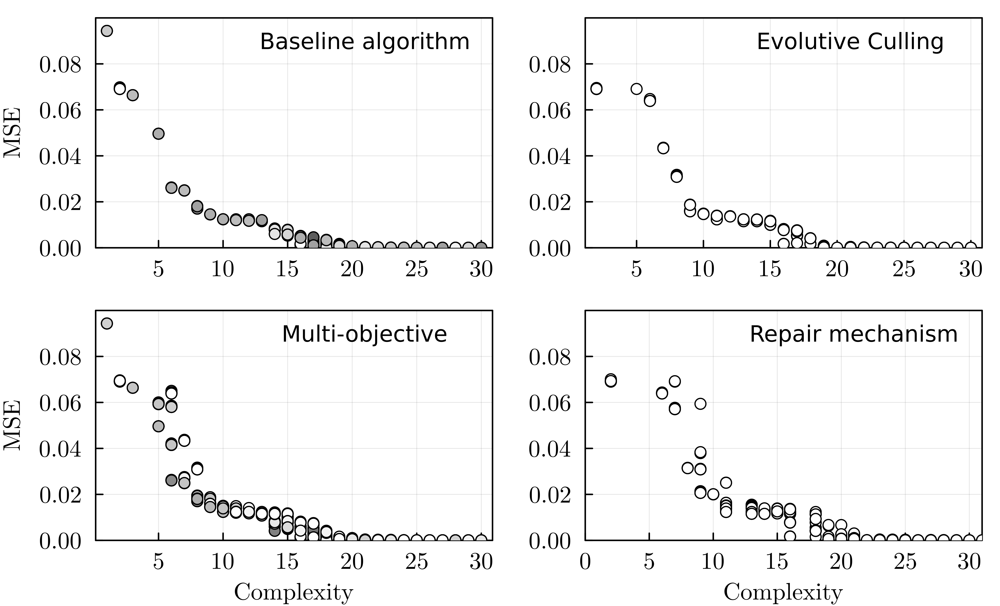

In [38]:
plot(all_PO_plots..., layout= (2,2), size = (660,400), dpi=1000)

In [39]:
savefig("plots/POplots_updated.svg")

"/Users/juliareu/GitCode/flowingSR/plots/POplots_updated.svg"

### The old analysis by level of noise

In [53]:
using Plots
using StatsPlots

original_df = collect_statistics_df[collect_statistics_df.ds_type .== "original", :]
wo_noise_df = collect_statistics_df[collect_statistics_df.ds_type .== "wo_noise", :]
three_noise_df = collect_statistics_df[collect_statistics_df.ds_type .== "03noise", :]
five_noise_df = collect_statistics_df[collect_statistics_df.ds_type .== "05noise", :]

original_by_dataset = groupby(original_df, :dataset, sort=true) 
wo_noise_by_dataset = groupby(wo_noise_df, :dataset, sort=true)
three_noise_by_dataset = groupby(three_noise_df, :dataset, sort=true) 
five_noise_by_dataset = groupby(five_noise_df, :dataset, sort=true)

algo_labels = ["f1f2f3_obj_penalty" "f1f2f4_baseline" "f1f2f4_correct_all" "f1f2f4_death_penalty" "f1f3f4_obj_penalty"]

function groupbar_from_df(df, column, title; y_lims=nothing)
    a = [Array{Float64}(x[!,column]) for x in df]
    a = mapreduce(permutedims, vcat, a)

    if y_lims != nothing
        groupedbar(a, bar_position = :dodge, bar_width=0.7, title = title, labels = algo_labels, y_lims=y_lims)
    else
        groupedbar(a, bar_position = :dodge, bar_width=0.7, title = title, labels = algo_labels)
    end
end

groupbar_from_df (generic function with 1 method)

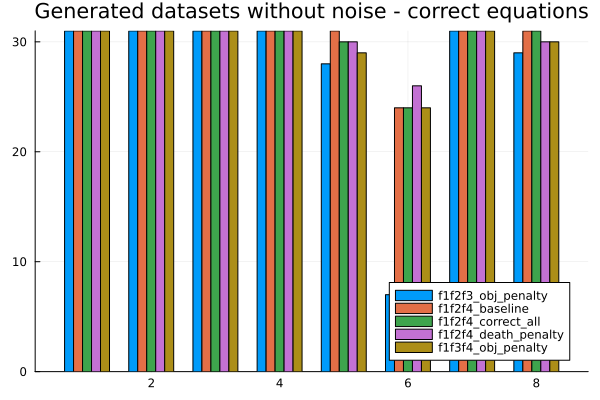

In [54]:
groupbar_from_df(wo_noise_by_dataset, :n_correct, "Generated datasets without noise - correct equations")

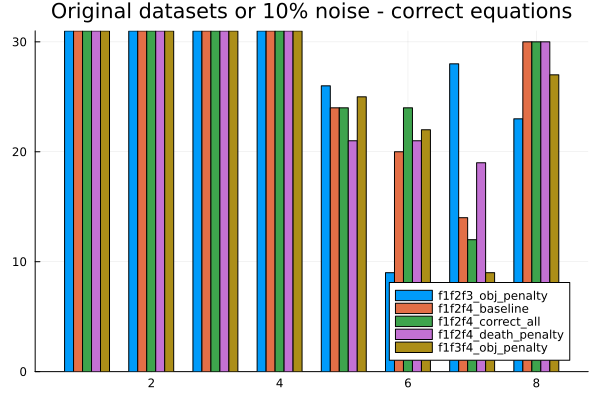

In [55]:
groupbar_from_df(original_by_dataset, :n_correct, "Original datasets or 10% noise - correct equations")

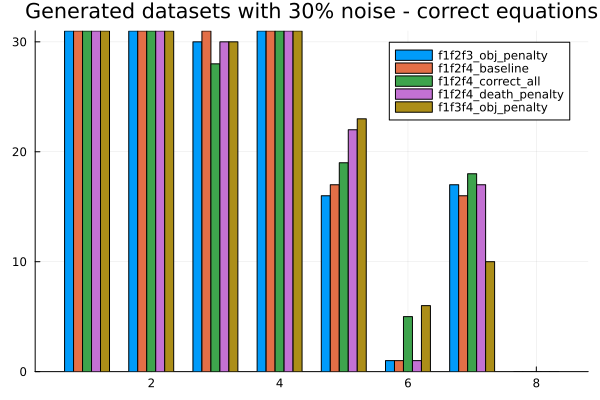

In [56]:
groupbar_from_df(three_noise_by_dataset, :n_correct, "Generated datasets with 30% noise - correct equations")

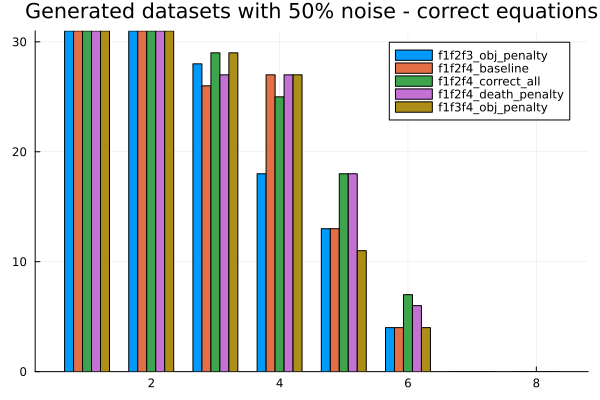

In [57]:
groupbar_from_df(five_noise_by_dataset, :n_correct, "Generated datasets with 50% noise - correct equations")

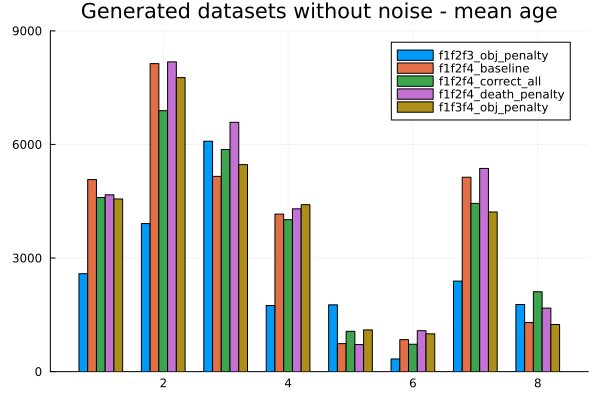

In [58]:
groupbar_from_df(wo_noise_by_dataset, :mean_age, "Generated datasets without noise - mean age", y_lims = [0,9000])

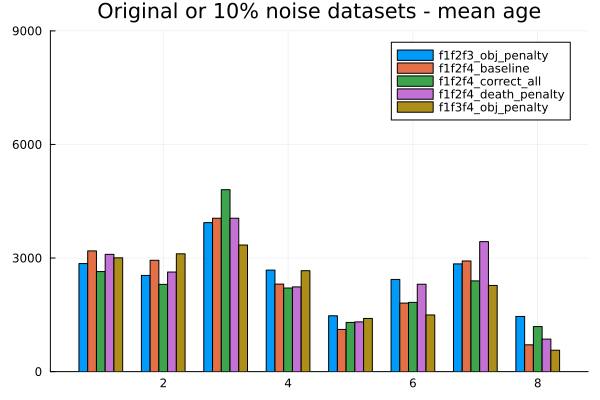

In [59]:
groupbar_from_df(original_by_dataset, :mean_age, "Original or 10% noise datasets - mean age", y_lims = [0,9000])

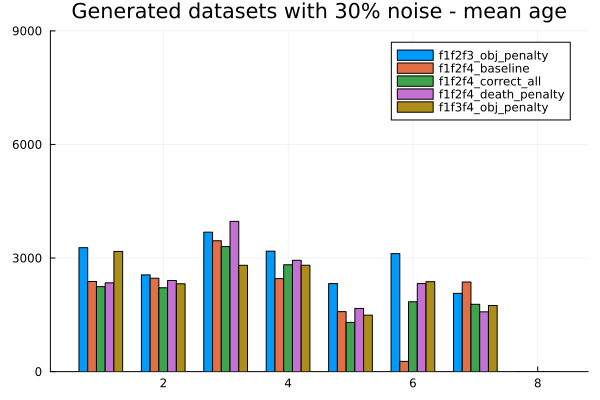

In [60]:
groupbar_from_df(three_noise_by_dataset, :mean_age, "Generated datasets with 30% noise - mean age", y_lims = [0,9000])

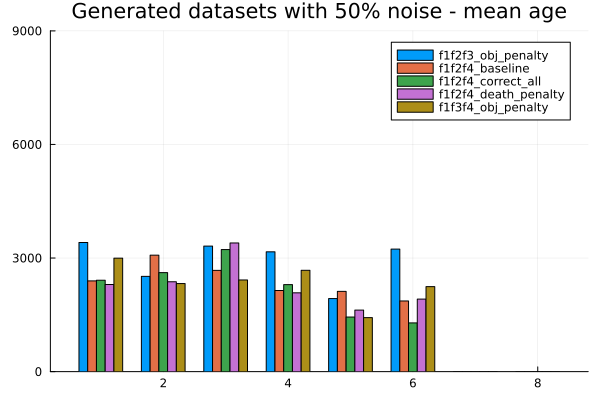

In [61]:
groupbar_from_df(five_noise_by_dataset, :mean_age, "Generated datasets with 50% noise - mean age", y_lims = [0,9000])

In [ ]:
columns = ["dataset", "ds_type", "algo", "n_correct", "n_false", "n", "mean_age"]
collect_statistics_df = DataFrame([name => [] for name in columns])

dataset = [1,2,3,5,6,7,8,9]
has_original_measures = [1,2,5,7] #original datasets available

algo = ["f1f2f3_obj_penalty", "f1f2f4_baseline", "f1f2f4_correct_all", "f1f2f4_death_penalty", "f1f3f4_obj_penalty"]
dataset_type = ["original", "wo_noise", "03noise", "05noise"]
for ds in dataset
    valid_eqs = String[]
    for dst in dataset_type
        if dst == "original"
            if ds in has_original_measures
                dataset_appendix = "_original"
            else
                dataset_appendix = "_generated_noise"
            end
        elseif dst == "wo_noise"
            dataset_appendix = "_generated_wo_noise"
        elseif dst == "03noise"
            dataset_appendix = "_generated_03noise"
        elseif dst == "05noise"
            dataset_appendix = "_generated_05noise"
        end

        for al in algo
            columns = ["run", "compl", "age", "dim_penalty", "minus_spearman", "mare", "mae",  "ms_processed_e", "eqs_orig_rounded"]

            res_good_df = CSV.read("./analysis/$(ds)$(dataset_appendix)_$(al)_good.csv", DataFrame) 
            res_bad_df = CSV.read("./analysis/$(ds)$(dataset_appendix)_$(al)_bad.csv", DataFrame) 
        end
        push!(collect_statistics_df, [ds, dst, al, n_correct, n_false, n_correct+n_false, mean_age])
    end
end


In [13]:
f(x) = 0.4 + 0.3 * (2^x)
y = [-1000.0,0.0,1.0,2.0,3.0,4.0,5.0,6.0]

#make list with all results
results = [f(x) for x in y]
println(results)
#add noise to results
scale = 0.15
results = results .+ scale * randn(length(results)) .* results
println(results)
println(results[end-1])


[0.4, 0.7, 1.0, 1.6, 2.8, 5.2, 10.0, 19.599999999999998]
[0.44911375002883547, 0.5735746621393415, 1.1840885066924551, 1.8235590136179887, 2.911715798188254, 5.243312675130011, 9.620519289469067, 20.725253341281196]
9.620519289469067
